In [ ]:
!pip install patchify

In [ ]:
!pip install -q --upgrade git+https://github.com/huggingface/transformers.git

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
import os
import zipfile

import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

from skimage import data
from skimage.filters import threshold_multiotsu
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error as mse
from skimage import img_as_ubyte
from skimage import io, color

from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split

from scipy.fft import fft, fftfreq
from scipy.ndimage import *
from scipy.stats import pearsonr

import pywt

import torch
import torch.nn as nn
import torchvision.models as models
from torchvision import transforms
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, TensorDataset

from tqdm.notebook import tqdm
import tifffile as tiff

from patchify import patchify
from PIL import Image

import prepare_utils

In [ ]:
from transformers import pipeline

In [ ]:
generator = pipeline("mask-generation", model="facebook/sam-vit-large")

# Uploads Data

In [ ]:
input_image = Image.open('rec_00400.tif')

input_matrix = np.array(input_image)

In [ ]:
input_matrix.shape

(2615, 2615)

In [ ]:
res = Image.open('Label_400_final.tif')

output_martix = np.array(res)
output_martix.shape

(2615, 2615)

# Preprocess Data

# AI models

## SAM

In [ ]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30 / 255, 144 / 255, 255 / 255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_masks_on_image(raw_image, masks):
  plt.imshow(np.array(raw_image))
  ax = plt.gca()
  ax.set_autoscale_on(False)
  for mask in masks:
      show_mask(mask, ax=ax, random_color=True)
  plt.axis("off")
  plt.show()

# Train models

In [ ]:
%%time
outputs = generator(input_image, points_per_batch=64)

masks = outputs["masks"]
show_masks_on_image(input_image, masks)

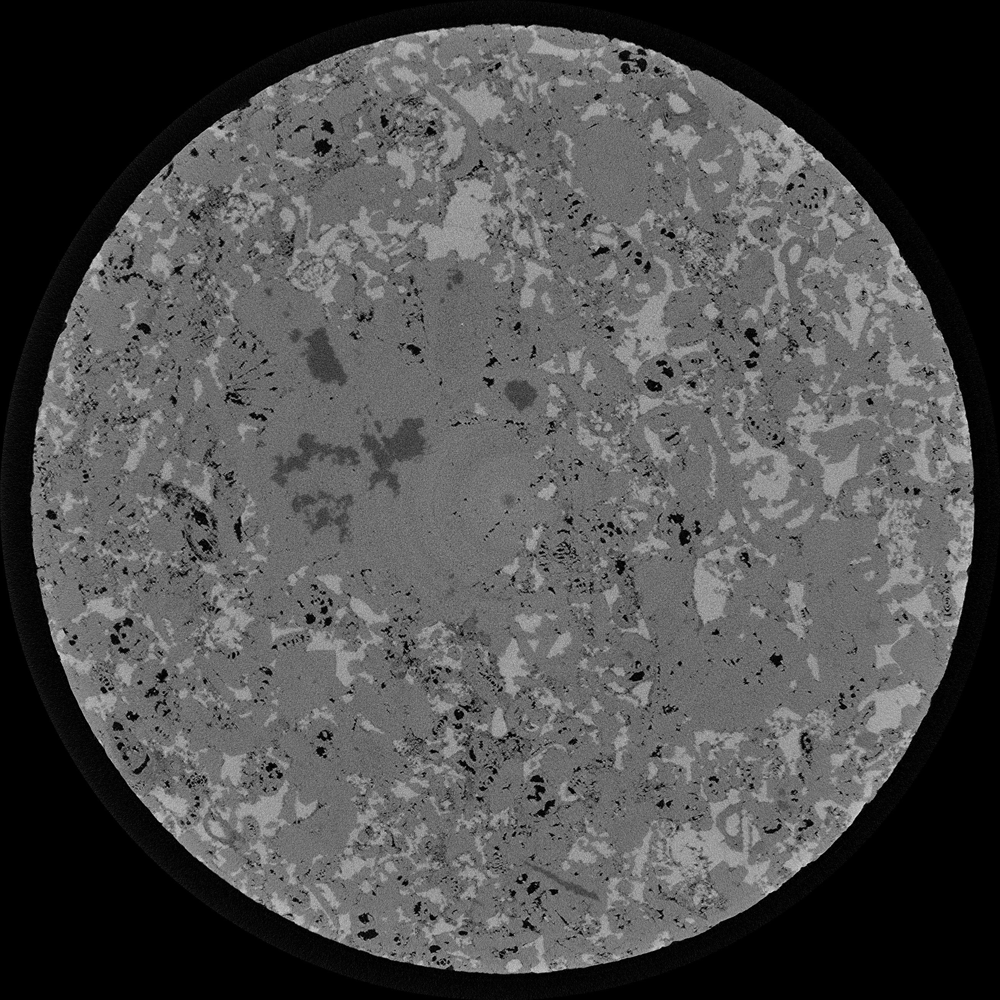

In [ ]:
input_image